## Imports

In [1]:
import matplotlib.pyplot as plt
from cryptovision.tools import (
    CryptoVisionAI, 
    image_directory_to_pandas, 
    split_image_dataframe, 
    tf_dataset_from_pandas
)

2025-01-09 11:25:40.870 | INFO     | cryptovision.config:<module>:15 - PROJ_ROOT path is: /Users/leonardo/Documents/Projects/cryptovision


## Special Functions

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.segmentation import mark_boundaries

def plot_og_saliency_lime_maps(
    original_image, 
    saliency_map, 
    lime_map, 
    predictions, 
    confidences,
    num_features=3,
    alpha=0.5,
    figure_size=(15, 6),
):
    """
    Plot original image, saliency map, and LIME map side by side with a legend.

    Parameters:
    - original_image (PIL.Image or np.ndarray): The original input image.
    - saliency_map (np.ndarray): The generated saliency map.
    - lime_map (tuple): The LIME map result as (image, mask).
    - predictions (tuple): Predictions for family, genus, and species.
    - confidences (tuple): Confidence scores for family, genus, and species.
    - figure_size (tuple): Size of the figure.
    """
    # Convert original image to numpy array if needed
    if not isinstance(original_image, np.ndarray):
        original_image = np.array(original_image)

    # Extract LIME image and mask from tuple
    temp, mask = lime_map.get_image_and_mask(
        lime_map.top_labels[0],
        num_features=num_features,
        negative_only=True,
        positive_only=False,
        hide_rest=True,
    )

    # Plot the three maps
    fig, axes = plt.subplots(1, 3, figsize=figure_size)

    # Plot Original Image
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Plot Saliency Map
    axes[1].imshow(original_image)
    axes[1].imshow(saliency_map[0], cmap='jet', alpha=alpha)
    axes[1].set_title("Saliency Map")
    axes[1].axis("off")

    # Plot LIME Map
    axes[2].imshow(original_image)
    axes[2].imshow(mark_boundaries(temp, mask), cmap='jet', alpha=alpha)
    axes[2].set_title("LIME Map")
    axes[2].axis("off")

    # Add a legend with predictions and confidences
    pred_text = (
        f"Family: {predictions[0]} ({confidences[0]*100:.2f}%)\n"
        f"Genus: {predictions[1]} ({confidences[1]*100:.2f}%)\n"
        f"Species: {predictions[2]} ({confidences[2]*100:.2f}%)"
    )

    fig.text(0.5, 0.05, pred_text, ha='center', fontsize=16, bbox={"facecolor": "white", "alpha": 0.5, "pad": 10})
    
    # Adjust layout
    plt.tight_layout()
    plt.show()


## Set Variables

In [3]:
IMAGES_DATASET_PATH = '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_images_dataset'
TRAINED_MODEL_PATH = '/Users/leonardo/Documents/Projects/cryptovision/models/phorcys_v09_hacpl_rn50v2_v2411251155.keras'

SEED = 42
VAL_SIZE = 0.15
TEST_SIZE = 0.15
BATCH_SIZE = 64

df_images = image_directory_to_pandas(IMAGES_DATASET_PATH)

train_df, val_df, test_df = split_image_dataframe(
    df_images,
    val_size=VAL_SIZE,
    test_size=TEST_SIZE,
    random_state=SEED,
)

test_df.reset_index(drop=True, inplace=True)

family_labels = sorted(df_images['family'].unique())
genus_labels = sorted(df_images['genus'].unique())
species_labels = sorted(df_images['species'].unique())

# Instantiate the class
ai = CryptoVisionAI(
    model_path=TRAINED_MODEL_PATH,
    family_names=family_labels,
    genus_names=genus_labels,
    species_names=species_labels,
)

test_ds, _, _, _ = tf_dataset_from_pandas(
    test_df, batch_size=BATCH_SIZE, image_size=ai.input_size, shuffle=False)


2024-12-20 14:30:00.465886: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3 Pro
2024-12-20 14:30:00.465910: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 36.00 GB
2024-12-20 14:30:00.465914: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 13.50 GB
2024-12-20 14:30:00.465926: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-12-20 14:30:00.465936: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
/Users/leonardo/miniconda3/envs/cvenv/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has

## Creating Saliency Maps + LIME - Example

In [49]:
# Select a Traget Image (Local Path)
image_path = "/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_saliency_maps_samples/Eviota/sjb_Eviota_albolineata_20.jpeg"

# Using the design class CryptoVisionAI
# 1st Predict the image
pred = ai.predict(image_path, top_k=3)

print(f"""
      --- CryptoVisionAI Prediction ---
      \t Family: {pred[0]} ({ai.confidence[0]*100:.2f}%)
      \t Genus: {pred[1]} ({ai.confidence[1]*100:.2f}%)
      \t Species: {pred[2]} ({ai.confidence[2]*100:.2f}%)   
""")


      --- CryptoVisionAI Prediction ---
      	 Family: Gobiidae (95.85%)
      	 Genus: Eviota (92.87%)
      	 Species: Eviota albolineata (76.22%)   



### Create Saliency Map

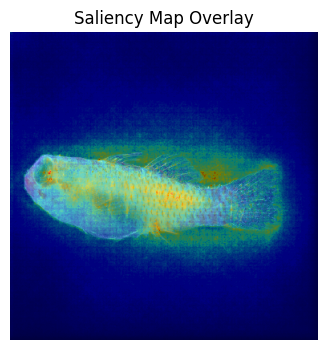

In [50]:
# Create the Saliency Map from Predicted Image
slcy_map = ai.generate_saliency_map('species', smooth_noise= .2, smooth_samples=100)
ai.plot_saliency_overlay(slcy_map, figure_size=(5,4))

### Create LIME plot

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


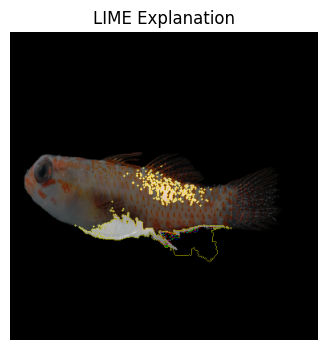

In [51]:
lime_map = ai.generate_lime_explanation(top_labels=1)
ai.plot_lime_results(lime_map, num_features=5, figure_size=(5,4))

### Compare plots

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


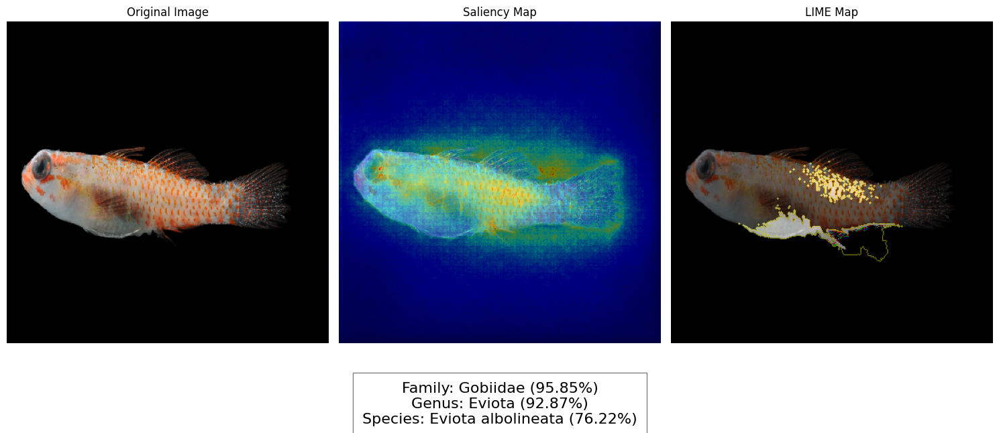

In [53]:
plot_og_saliency_lime_maps(
    original_image=ai.image,
    saliency_map=slcy_map,
    lime_map=lime_map,
    predictions=pred,
    confidences=ai.confidence,
    figure_size=(15, 8),
    num_features=5
)

## Compare Saliency Maps (Family vs Genus vs Species)

In [8]:
fm_slcy_map = ai.generate_saliency_map(level='family',smooth_samples=100,smooth_noise=0.2)
gn_slcy_map = ai.generate_saliency_map(level='genus',smooth_samples=100,smooth_noise=0.2)
sp_slcy_map = ai.generate_saliency_map(level='species',smooth_samples=100,smooth_noise=0.2)

(-0.5, 383.5, 383.5, -0.5)

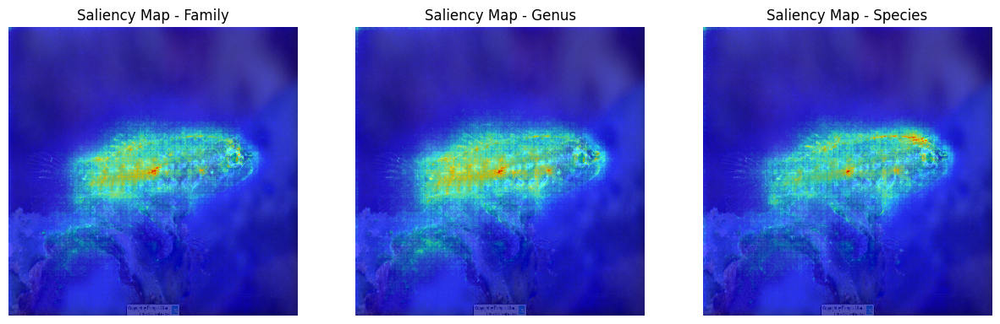

In [14]:
import matplotlib.pyplot as plt 

# Plot the three maps
fig, axes = plt.subplots(1, 3, figsize=(15, 8))

# Plot Original Image
axes[0].imshow(ai.image)
axes[0].imshow(fm_slcy_map[0], cmap='jet', alpha=0.7)
axes[0].set_title("Saliency Map - Family")
axes[0].axis("off")

# Plot Saliency Map
axes[1].imshow(ai.image)
axes[1].imshow(gn_slcy_map[0], cmap='jet', alpha=0.7)
axes[1].set_title("Saliency Map - Genus")
axes[1].axis("off")

# Plot LIME Map
axes[2].imshow(ai.image)
axes[2].imshow(sp_slcy_map[0], cmap='jet', alpha=0.7)
axes[2].set_title("Saliency Map - Species")
axes[2].axis("off")

## Extract Salient Regions (Percentile)

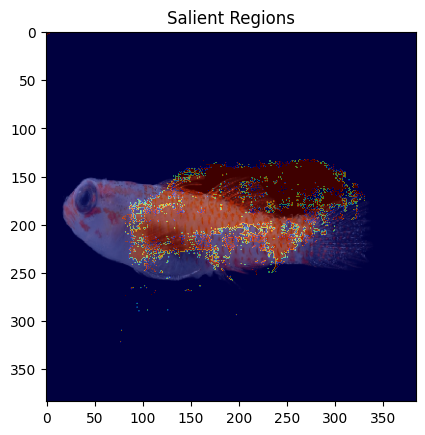

In [72]:
import numpy as np

def extract_salient_regions(aggregated_map, percentile=90):
    """
    Extract the key salient regions from the aggregated saliency map.

    Parameters:
    ----------
    aggregated_map : np.ndarray
        The aggregated saliency map (2D array).
    percentile : int, optional
        The percentile threshold to select the most salient pixels. Default is 90.

    Returns:
    -------
    salient_mask : np.ndarray
        Binary mask highlighting salient regions.
    """
    threshold = np.percentile(aggregated_map, percentile)
    salient_mask = aggregated_map > threshold
    return salient_mask

# Apply to aggregated map
salient_mask = extract_salient_regions(sp_slcy_map[0], percentile=90)
plt.imshow(ai.image)
plt.imshow(salient_mask, cmap='jet', alpha=0.5)
plt.title('Salient Regions')
plt.show()


## Create Aggregation Saliency Map

In [4]:
import os
from tqdm import tqdm

folder_path = '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_saliency_maps_samples/Eviota'
slcy_maps = []
predictions = []
confidences = []

for image in tqdm(os.listdir(folder_path)):
    if not image.lower().endswith("jpeg") or image.lower().startswith("."):
        print('Invalid File')
        continue
    
    image_path = folder_path + '/' + image
    
    preds = ai.predict(image_path)
    slcy_map = ai.generate_saliency_map('species')
    
    slcy_maps.append(slcy_map[0])
    predictions.append(preds)
    
    

100%|██████████| 6/6 [00:32<00:00,  5.40s/it]


In [5]:
saliency_map1 = slcy_maps[0]
saliency_map2 = slcy_maps[1]

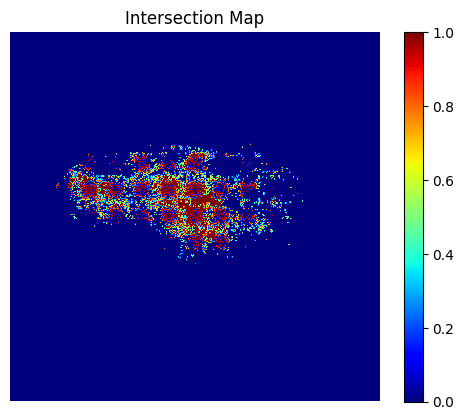

In [13]:
def intersect_saliency_maps(map1, map2, threshold=0.5):
    """
    Compute the intersection of two saliency maps.

    Parameters:
    ----------
    map1, map2 : np.ndarray
        Two saliency maps to compare.
    threshold : float, optional
        Threshold to retain high-saliency regions (default is 0.5).

    Returns:
    -------
    intersection_map : np.ndarray
        Intersection map highlighting common regions.
    """
    # Normalize the maps
    map1 = (map1 - np.min(map1)) / (np.max(map1) - np.min(map1))
    map2 = (map2 - np.min(map2)) / (np.max(map2) - np.min(map2))

    # Thresholding
    map1_binary = map1 > threshold
    map2_binary = map2 > threshold

    # Element-wise intersection
    intersection_map = np.logical_and(map1_binary, map2_binary).astype(np.float32)
    return intersection_map

# Example usage
intersection_map = intersect_saliency_maps(saliency_map1, saliency_map2, threshold=0.3)
plt.imshow(intersection_map, cmap='jet')
plt.title('Intersection Map')
plt.colorbar()
plt.axis('off')
plt.show()


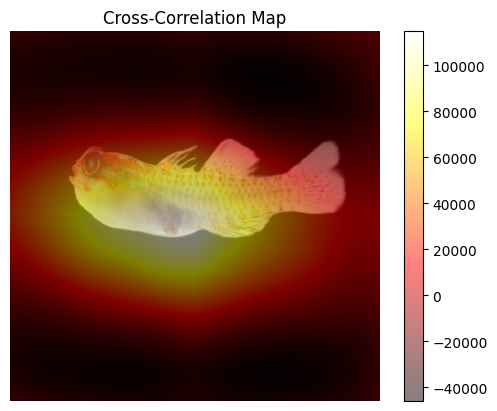

In [8]:
from scipy.signal import correlate2d

def cross_correlate_maps(map1, map2):
    """
    Compute the cross-correlation between two saliency maps.

    Parameters:
    ----------
    map1, map2 : np.ndarray
        Two saliency maps to compare.

    Returns:
    -------
    correlation_map : np.ndarray
        Map showing cross-correlation values.
    """
    # Normalize the maps
    map1 = (map1 - np.mean(map1)) / (np.std(map1) + 1e-5)
    map2 = (map2 - np.mean(map2)) / (np.std(map2) + 1e-5)

    # Compute cross-correlation
    correlation_map = correlate2d(map1, map2, mode='same')
    return correlation_map

# Example usage
correlation_map = cross_correlate_maps(saliency_map1, saliency_map2)
plt.imshow(ai.image)
plt.imshow(correlation_map, cmap='hot', alpha=0.5)
plt.title('Cross-Correlation Map')
plt.colorbar()
plt.axis('off')
plt.show()


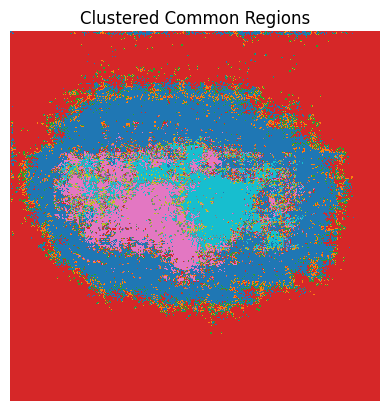

In [12]:
from sklearn.cluster import KMeans

def cluster_common_regions(map1, map2, n_clusters=3):
    """
    Cluster common regions in two saliency maps.

    Parameters:
    ----------
    map1, map2 : np.ndarray
        Two saliency maps to compare.
    n_clusters : int, optional
        Number of clusters to form.

    Returns:
    -------
    clustered_map : np.ndarray
        Map showing clustered common regions.
    """
    # Normalize and stack maps
    map1 = (map1 - np.min(map1)) / (np.max(map1) - np.min(map1))
    map2 = (map2 - np.min(map2)) / (np.max(map2) - np.min(map2))
    combined = np.stack([map1, map2], axis=-1).reshape(-1, 2)

    # Apply k-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(combined)
    clustered_map = kmeans.labels_.reshape(map1.shape)
    return clustered_map

# Example usage
clustered_map = cluster_common_regions(saliency_map1, saliency_map2, n_clusters=4)
plt.imshow(clustered_map, cmap='tab10')
plt.title('Clustered Common Regions')
plt.axis('off')
plt.show()


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from tf_keras_vis.utils import normalize
from skimage import measure, color
import tensorflow as tf

def preprocess_and_center_image(image, target_size=(224, 224), padding_value=0):
    """
    Preprocesses the image by detecting the bounding box of the object (fish),
    cropping it, resizing, and centering the object.

    Parameters:
    ----------
    image : np.ndarray
        Input image array (H, W, C).
    target_size : tuple, optional
        The desired output size of the image (default is (224, 224)).
    padding_value : int, optional
        The value used to pad the image (default is 0 for black).

    Returns:
    -------
    np.ndarray
        Preprocessed, centered, and resized image.
    """
    # Convert image to grayscale and find the object region
    gray_image = color.rgb2gray(image)
    thresh = gray_image > 0.05  # Threshold to identify the fish
    labeled_image = measure.label(thresh)
    regions = measure.regionprops(labeled_image)

    # Find the largest region (assuming it's the fish)
    if not regions:
        raise ValueError("No object detected in the image.")
    largest_region = max(regions, key=lambda r: r.area)
    minr, minc, maxr, maxc = largest_region.bbox

    # Crop the bounding box
    cropped_image = image[minr:maxr, minc:maxc]

    # Resize and pad the image to center the object
    resized_image = tf.image.resize(cropped_image, target_size, method='bilinear')
    centered_image = tf.image.pad_to_bounding_box(
        resized_image, 0, 0, target_size[0], target_size[1]
    )
    return centered_image.numpy()

def combine_saliency_maps(saliency_maps, method='average', weighted=False, percentile=95):
    """
    Combines multiple saliency maps using the specified method with an optional fine-scale weighting.

    Parameters:
    ----------
    saliency_maps : list of np.ndarray
        List of saliency maps (2D arrays) to combine.
    method : str, optional
        Method to combine the saliency maps. Options are:
        - 'average': Takes the average of the saliency maps.
        - 'max': Takes the maximum value across all saliency maps.
        - 'min': Takes the minimum value across all saliency maps.
    weighted : bool, optional
        Whether to apply weighted aggregation emphasizing key locations across the maps.
    percentile : int, optional
        Percentile threshold to isolate significant pixels (default is 90).

    Returns:
    -------
    np.ndarray
        The combined saliency map.
    """
    if not saliency_maps:
        raise ValueError("The saliency_maps list is empty.")

    # Stack all saliency maps along a new dimension
    stacked_maps = np.stack(saliency_maps, axis=0)

    if weighted:
        # Compute a weight map emphasizing high saliency values based on the percentile threshold
        threshold = np.percentile(stacked_maps, percentile)
        weight_map = np.sum(stacked_maps >= threshold, axis=0)
        weight_map = weight_map / weight_map.max()  # Normalize
        weighted_maps = stacked_maps * weight_map[np.newaxis, :, :]
    else:
        weighted_maps = stacked_maps

    if method == 'average':
        combined_map = np.mean(weighted_maps, axis=0)
    elif method == 'max':
        combined_map = np.max(weighted_maps, axis=0)
    elif method == 'min':
        combined_map = np.min(weighted_maps, axis=0)
    else:
        raise ValueError(f"Invalid method: {method}. Choose 'average', 'max', or 'min'.")

    # Normalize the combined map
    combined_map = normalize(combined_map)

    return combined_map

def plot_combined_saliency(combined_map, original_image, alpha=0.5):
    """
    Plots the combined saliency map alongside the original image.

    Parameters:
    ----------
    combined_map : np.ndarray
        The combined saliency map.
    original_image : np.ndarray
        The original image (H, W, C).
    alpha : float, optional
        The transparency level for the overlay (default is 0.5).
    """
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Combined Saliency Map
    plt.subplot(1, 3, 2)
    plt.title("Combined Saliency Map")
    plt.imshow(combined_map, cmap='jet')
    plt.axis('off')

    # Overlay Saliency Map on Original Image
    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(original_image)
    plt.imshow(combined_map, cmap='jet', alpha=alpha)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


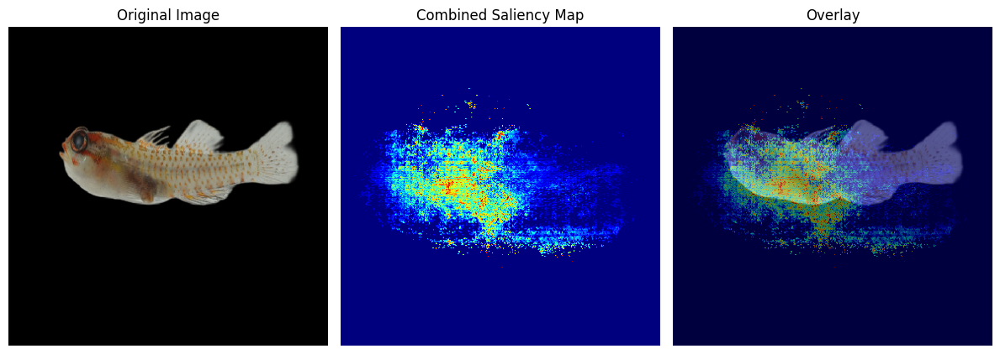

In [9]:
comb_maps = combine_saliency_maps(slcy_maps, method='min', weighted=True, percentile=95)

plot_combined_saliency(comb_maps, ai.image)

## Aggregated Saliency Maps

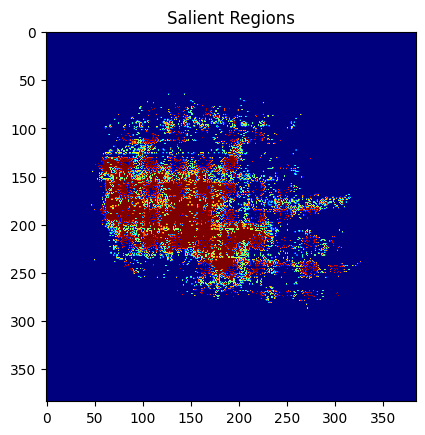

In [121]:
def extract_salient_regions(aggregated_map, percentile=90):
    """
    Extract the key salient regions from the aggregated saliency map.

    Parameters:
    ----------
    aggregated_map : np.ndarray
        The aggregated saliency map (2D array).
    percentile : int, optional
        The percentile threshold to select the most salient pixels. Default is 90.

    Returns:
    -------
    salient_mask : np.ndarray
        Binary mask highlighting salient regions.
    """
    threshold = np.percentile(aggregated_map, percentile)
    salient_mask = aggregated_map > threshold
    return salient_mask

# Apply to aggregated map
salient_mask = extract_salient_regions(comb_maps, percentile=90)
plt.imshow(salient_mask, cmap='jet')
plt.title('Salient Regions')
plt.show()


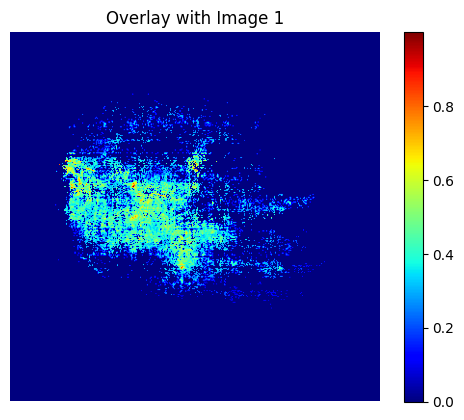

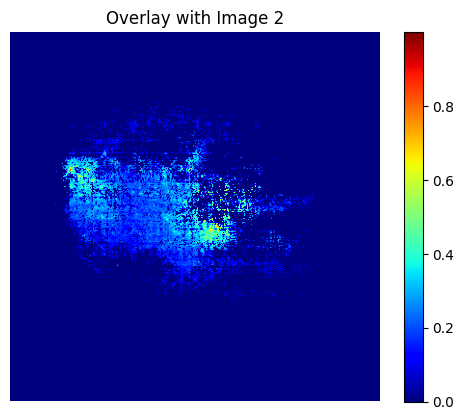

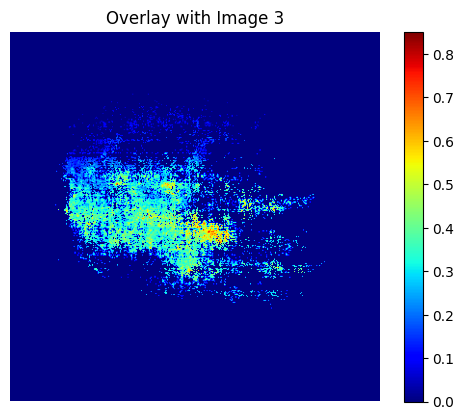

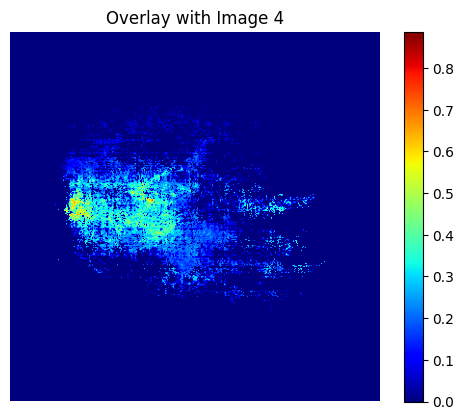

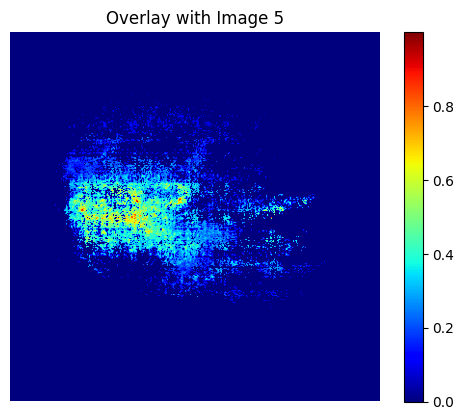

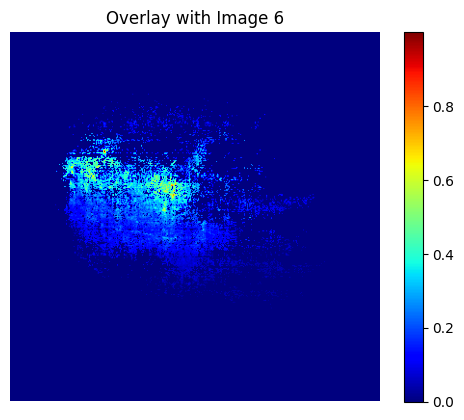

In [122]:
def overlay_salient_regions(aggregated_map, individual_maps, percentile=90):
    """
    Overlay salient regions from the aggregated map onto individual saliency maps.

    Parameters:
    ----------
    aggregated_map : np.ndarray
        The aggregated saliency map.
    individual_maps : list of np.ndarray
        List of individual saliency maps.
    percentile : int, optional
        The percentile threshold to select salient regions.

    Returns:
    -------
    overlays : list of np.ndarray
        List of overlayed saliency maps.
    """
    salient_mask = extract_salient_regions(aggregated_map, percentile)
    overlays = []
    for i, individual_map in enumerate(individual_maps):
        overlay = individual_map * salient_mask
        overlays.append(overlay)
        plt.figure()
        plt.title(f'Overlay with Image {i+1}')
        plt.imshow(overlay, cmap='jet')
        plt.colorbar()
        plt.axis('off')
        plt.show()
    return overlays

# Apply to a set of individual maps
overlays = overlay_salient_regions(comb_maps, slcy_maps)


Mean Intensity: 0.28866
Variance Intensity: 0.0039174818


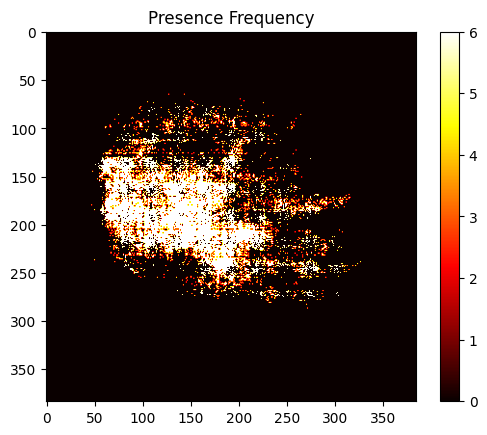

In [123]:
def analyze_salient_traits(salient_mask, individual_maps):
    """
    Analyze common traits by evaluating salient regions across individual maps.

    Parameters:
    ----------
    salient_mask : np.ndarray
        Binary mask of salient regions.
    individual_maps : list of np.ndarray
        List of individual saliency maps.

    Returns:
    -------
    metrics : dict
        Dictionary of metrics for salient regions, including mean and variance.
    """
    intensities = [np.mean(individual_map[salient_mask]) for individual_map in individual_maps]
    mean_intensity = np.mean(intensities)
    variance_intensity = np.var(intensities)
    presence_frequency = np.sum([salient_mask & (individual_map > 0) for individual_map in individual_maps], axis=0)

    return {
        "mean_intensity": mean_intensity,
        "variance_intensity": variance_intensity,
        "presence_frequency": presence_frequency
    }

# Analyze salient traits
metrics = analyze_salient_traits(salient_mask, slcy_maps)
print("Mean Intensity:", metrics["mean_intensity"])
print("Variance Intensity:", metrics["variance_intensity"])
plt.imshow(metrics["presence_frequency"], cmap='hot')
plt.title("Presence Frequency")
plt.colorbar()
plt.show()


In [27]:
from sklearn.cluster import KMeans

def cluster_salient_regions(salient_mask, n_clusters=5):
    """
    Cluster salient regions to identify shared patterns.

    Parameters:
    ----------
    salient_mask : np.ndarray
        Binary mask of salient regions.
    n_clusters : int, optional
        Number of clusters to form.

    Returns:
    -------
    clustered_map : np.ndarray
        Map showing clustered salient regions.
    """
    y, x = np.where(salient_mask)
    coords = np.stack([x, y], axis=1)
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(coords)
    clustered_map = np.zeros_like(salient_mask, dtype=int)
    clustered_map[y, x] = kmeans.labels_ + 1
    return clustered_map

# Cluster salient regions
#clustered_map = cluster_salient_regions(salient_mask, n_clusters=10)
#plt.imshow(ai.image)
#plt.imshow(clustered_map, cmap='tab10', alpha=0.6)
#plt.title("Clustered Salient Regions")
#plt.axis('off')
#plt.show()


In [126]:
ai.predict('/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_saliency_maps_samples/Eviota/sjb_Eviota_albolineata_44.jpeg')

('Gobiidae', 'Eviota', 'Eviota albolineata')

In [127]:
def compute_iou(aggregated_map, individual_maps, threshold=0.5):
    """
    Compute Intersection over Union (IoU) between aggregated map and individual maps.

    Parameters:
    ----------
    aggregated_map : np.ndarray
        Aggregated saliency map (2D array).
    individual_maps : list of np.ndarray
        List of individual saliency maps (2D arrays).
    threshold : float
        Threshold to binarize saliency maps.

    Returns:
    -------
    iou_scores : list
        IoU scores for each individual map.
    """
    iou_scores = []
    # Binarize aggregated map
    aggregated_binary = aggregated_map > threshold * np.max(aggregated_map)
    
    for individual_map in individual_maps:
        # Binarize individual map
        individual_binary = individual_map > threshold * np.max(individual_map)
        
        # Compute intersection and union
        intersection = np.logical_and(aggregated_binary, individual_binary).sum()
        union = np.logical_or(aggregated_binary, individual_binary).sum()
        
        iou_scores.append(intersection / union if union != 0 else 0)
    
    return iou_scores


compute_iou(comb_maps, slcy_maps)

[0.12386777115429279,
 0.019473352254809208,
 0.06375069208257533,
 0.019139925069229517,
 0.10869565217391304,
 0.021297429620563035]

In [128]:
from scipy.ndimage import center_of_mass

def compute_centroid_distance(aggregated_map, individual_maps):
    """
    Compute the distance between the centroids of the aggregated map and individual maps.

    Parameters:
    ----------
    aggregated_map : np.ndarray
        Aggregated saliency map (2D array).
    individual_maps : list of np.ndarray
        List of individual saliency maps (2D arrays).

    Returns:
    -------
    distances : list
        Centroid distances for each individual map.
    """
    distances = []
    aggregated_centroid = center_of_mass(aggregated_map)
    
    for individual_map in individual_maps:
        individual_centroid = center_of_mass(individual_map)
        distance = np.linalg.norm(np.array(aggregated_centroid) - np.array(individual_centroid))
        distances.append(distance)
    
    return distances


compute_centroid_distance(comb_maps, slcy_maps)



[14.484784314810442,
 25.082710190357222,
 22.7881384367581,
 22.689075183471118,
 14.943721567993915,
 29.474624346765214]

## Saliency Analysis

In [66]:
image_path = '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_saliency_maps_samples/Eviota/sjb_Eviota_albolineata_44.jpeg'
preds = ai.predict(image_path)

print(preds)
print(ai.confidence)

('Gobiidae', 'Eviota', 'Eviota albolineata')
(0.9062, 0.9795, 0.7866)


(-0.5, 383.5, 383.5, -0.5)

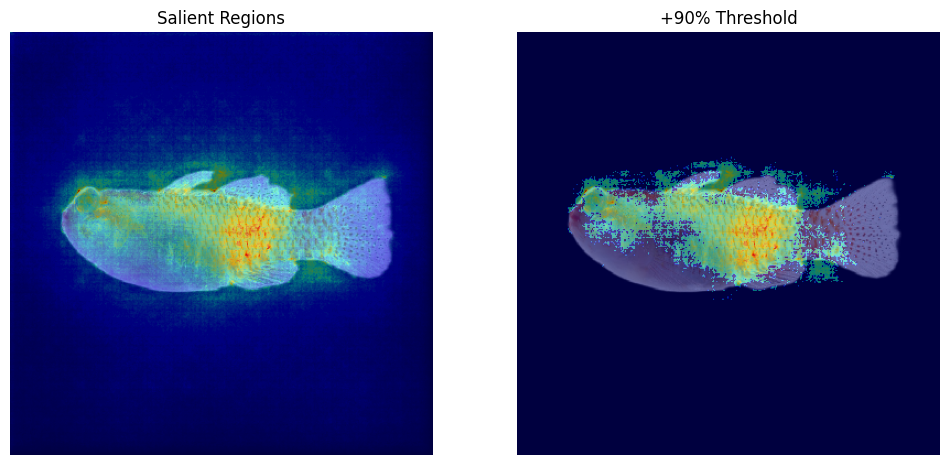

In [67]:
slcy_map = ai.generate_saliency_map('species', smooth_noise=0.2, smooth_samples=100)

stacked_maps = slcy_map

threshold = np.percentile(stacked_maps, 90)
weight_map = np.sum(stacked_maps >= threshold, axis=0)
weight_map = weight_map / weight_map.max()  # Normalize
weighted_maps = stacked_maps * weight_map[np.newaxis, :, :]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(ai.image)
plt.imshow(slcy_map[0], cmap='jet', alpha=0.5)
plt.title('Salient Regions')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ai.image)
plt.imshow(weighted_maps[0], cmap='jet', alpha=0.5)
plt.title('+90% Threshold')
plt.axis('off')

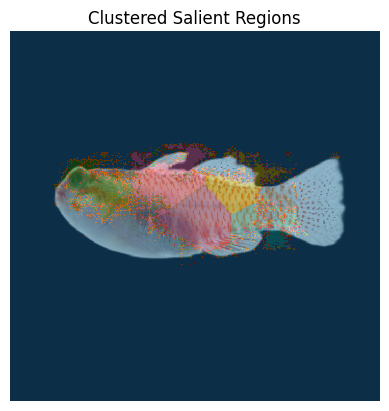

In [68]:
# Cluster salient regions
clustered_map = cluster_salient_regions(weighted_maps[0], n_clusters=5)
plt.imshow(ai.image)
plt.imshow(clustered_map, cmap='tab10', alpha=0.4)
plt.title("Clustered Salient Regions")
plt.axis('off')
plt.show()

## Aggretation LIME + Saliency Maps

In [70]:
lime_map = ai.generate_lime_explanation(top_labels=1)
ai.plot_lime_results(lime_map, num_features=10, figure_size=(6, 6))

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 383.5, 383.5, -0.5)

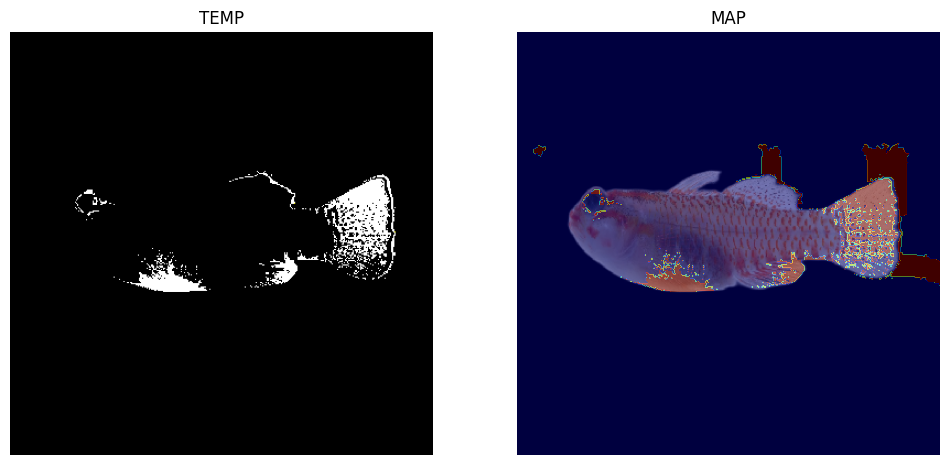

In [85]:
temp, mask = lime_map.get_image_and_mask(
    lime_map.top_labels[0],
    num_features=10,
    negative_only=True,
    positive_only=False,
    hide_rest=True
)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(temp, cmap='jet', alpha=1)
plt.title('TEMP')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ai.image)
plt.imshow(mask, cmap='jet', alpha=0.5)
plt.title('MAP')
plt.axis('off')

(-0.5, 383.5, 383.5, -0.5)

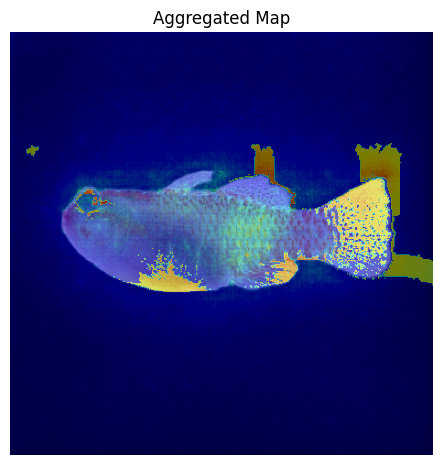

In [89]:
def agg_map(saliency_map, lime_temp, lime_mask, alpha=0.5):
    """
    Aggregate the Saliency Map and LIME Map.

    Parameters:
    ----------
    saliency_map : np.ndarray
        The saliency map.
    lime_temp : np.ndarray
        The LIME temp image.
    lime_mask : np.ndarray
        The LIME mask.
    alpha : float, optional
        The transparency level for the overlay (default is 0.5).

    Returns:
    -------
    agg_map : np.ndarray
        The aggregated map.
    """
    agg_map = np.zeros_like(saliency_map)
    agg_map += saliency_map
    agg_map += lime_mask
    return agg_map

aggreg_map = agg_map(slcy_map[0], temp, mask)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(ai.image)
plt.imshow(aggreg_map, cmap='jet', alpha=0.5)
plt.title('Aggregated Map')
plt.axis('off')

## Maps representation template

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 10%|█         | 1/10 [00:53<08:01, 53.54s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 20%|██        | 2/10 [01:47<07:08, 53.56s/it]

Invalid File


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 40%|████      | 4/10 [02:41<03:42, 37.12s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 50%|█████     | 5/10 [03:33<03:27, 41.55s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 60%|██████    | 6/10 [04:34<03:09, 47.49s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 70%|███████   | 7/10 [05:22<02:23, 47.84s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 80%|████████  | 8/10 [06:20<01:41, 50.83s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 90%|█████████ | 9/10 [07:14<00:51, 51.91s/it]

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
100%|██████████| 10/10 [08:08<00:00, 48.83s/it]


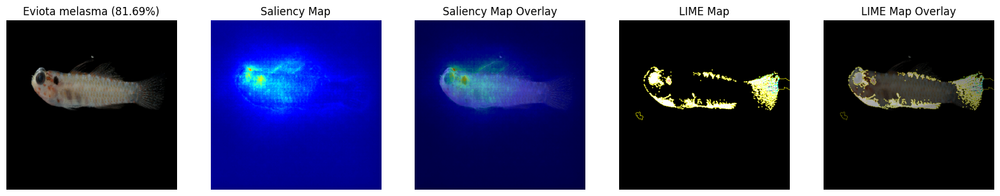

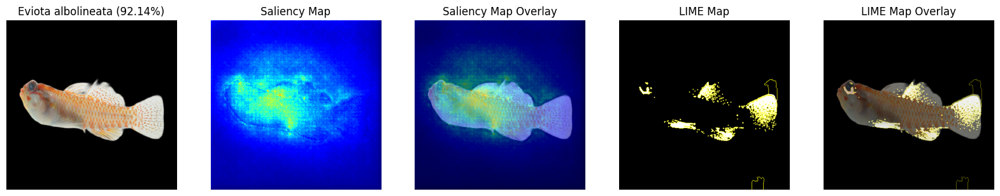

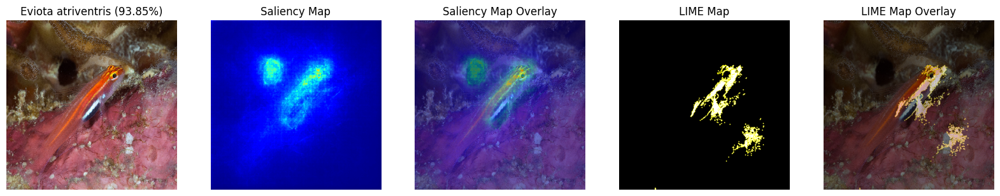

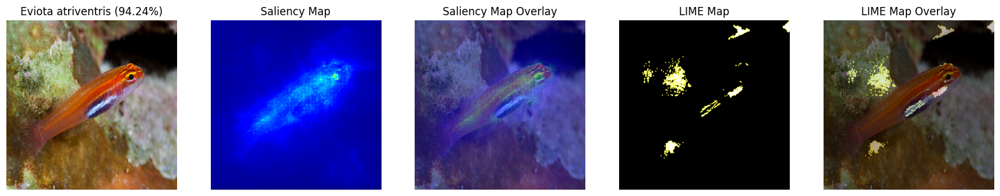

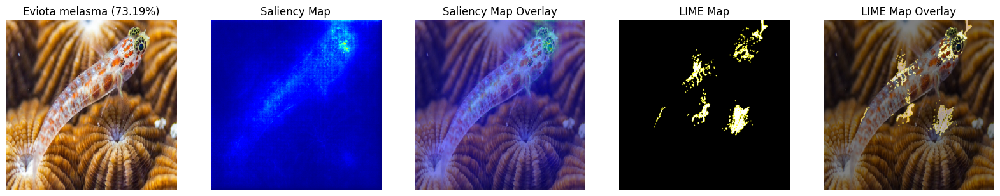

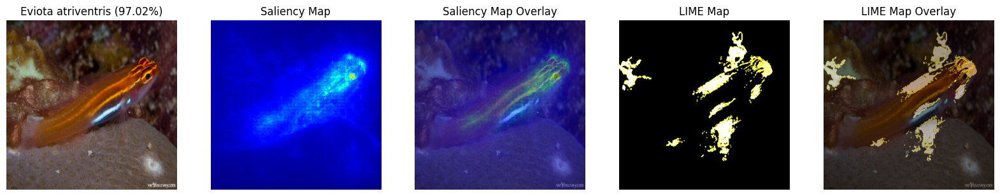

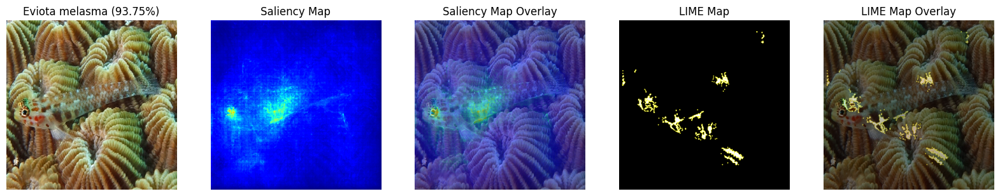

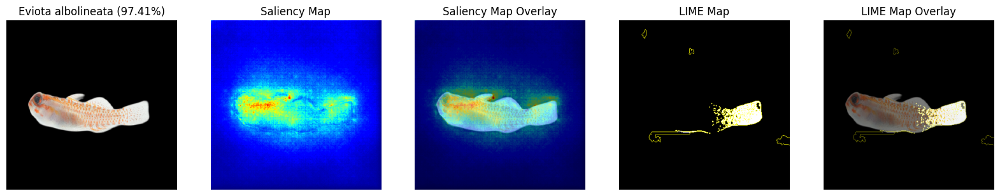

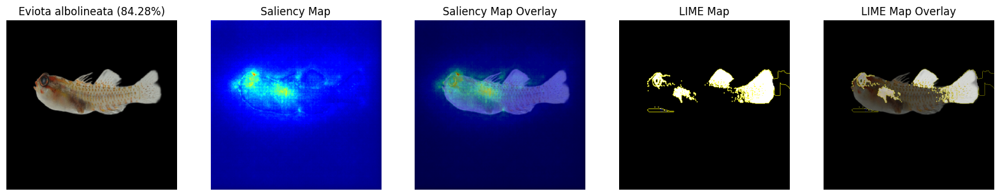

In [21]:
import os
from tqdm import tqdm

folder_path = '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_saliency_maps_samples/Eviota'
slcy_maps = []
predictions = []
confidences = []

for image in tqdm(os.listdir(folder_path)):
    if not image.lower().endswith("jpeg") or image.lower().startswith("."):
        print('Invalid File')
        continue
    
    image_path = folder_path + '/' + image
    
    preds = ai.predict(image_path)
    slcy_map = ai.generate_saliency_map('species', smooth_noise=0.2, smooth_samples=100)
    lime_map = ai.generate_lime_explanation(top_labels=1)
    
    temp, mask = lime_map.get_image_and_mask(
        lime_map.top_labels[0],
        num_features=10,
        negative_only=True,
        positive_only=False,
        hide_rest=True
    )
    
    slcy_maps.append(slcy_map[0])
    predictions.append(preds)
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 5, 1)
    plt.imshow(ai.image)
    plt.title(f'{preds[2]} ({ai.confidence[2]*100:.2f}%)')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(slcy_map[0], cmap='jet')
    plt.title('Saliency Map')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(ai.image)
    plt.imshow(slcy_map[0], cmap='jet', alpha=0.5)
    plt.title('Saliency Map Overlay')
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(mark_boundaries(temp, mask), cmap='jet')
    plt.title('LIME Map')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(ai.image)
    plt.imshow(mark_boundaries(temp, mask), cmap='jet', alpha=0.5)
    plt.title('LIME Map Overlay')
    plt.axis('off')

In [22]:
folder_path = '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_saliency_maps_samples/Eviota'

image_set = []

for image in os.listdir(folder_path):
    if not image.lower().endswith("jpeg") or image.lower().startswith("."):
        continue
    
    image_path = folder_path + '/' + image
    
    preds = ai.predict(image_path)
    image_set.append(ai.image)
    
    
    print(f"{image} - {preds[2]} ({ai.confidence[2]*100:.2f}%)")

sjb_Eviota_melasma_20.jpeg - Eviota melasma (81.69%)
sjb_Eviota_albolineata_34.jpeg - Eviota albolineata (92.14%)
web_Eviota_atriventris_114.jpeg - Eviota atriventris (93.85%)
web_Eviota_atriventris_117.jpeg - Eviota atriventris (94.24%)
web_Eviota_melasma_12.jpeg - Eviota melasma (73.19%)
web_Eviota_atriventris_120.jpeg - Eviota atriventris (97.02%)
web_Eviota_melasma_15.jpeg - Eviota melasma (93.75%)
sjb_Eviota_albolineata_56.jpeg - Eviota albolineata (97.41%)
sjb_Eviota_albolineata_40.jpeg - Eviota albolineata (84.28%)


In [5]:
eviota_test_df = test_df[test_df['genus'] == 'Eviota']

eviota_test_df.reset_index(drop=True, inplace=True)

eviota_test_df.head()

,image_path,folder_label,family,genus,species
0,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_albolineata,Gobiidae,Eviota,Eviota albolineata
1,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_melasma,Gobiidae,Eviota,Eviota melasma
2,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_atriventris,Gobiidae,Eviota,Eviota atriventris
3,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_atriventris,Gobiidae,Eviota,Eviota atriventris
4,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_albolineata,Gobiidae,Eviota,Eviota albolineata


In [6]:
species_preds = []
species_confidences = []

for row in eviota_test_df.itertuples():
    image_path = row.image_path
    
    if image_path == '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_images_dataset/Gobiidae_Eviota_melasma/web_Eviota_melasma_15.jpeg':
        continue
    
    preds = ai.predict(image_path)
    
    species_preds.append(preds[2])
    species_confidences.append(ai.confidence[2])

eviota_test_df['species_pred'] = species_preds
eviota_test_df['species_confidence'] = species_confidences

2024-12-20 14:30:13.165381: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
/var/folders/ly/n8bq86ts0ll5r26z909jdzv40000gn/T/ipykernel_55760/2411258516.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eviota_test_df['species_pred'] = species_preds
/var/folders/ly/n8bq86ts0ll5r26z909jdzv40000gn/T/ipykernel_55760/2411258516.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eviota_test_df['species_confidence'] = species_confi

In [7]:
eviota_test_df.head(100)

,image_path,folder_label,family,genus,species,species_pred,species_confidence
0,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_albolineata,Gobiidae,Eviota,Eviota albolineata,Eviota albolineata,0.562500
1,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_melasma,Gobiidae,Eviota,Eviota melasma,Eviota melasma,0.812500
2,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_atriventris,Gobiidae,Eviota,Eviota atriventris,Eviota atriventris,0.441895
3,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_atriventris,Gobiidae,Eviota,Eviota atriventris,Eviota atriventris,0.827637
4,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_albolineata,Gobiidae,Eviota,Eviota albolineata,Eviota albolineata,0.848633
5,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_melasma,Gobiidae,Eviota,Eviota melasma,Eviota melasma,0.789551
6,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_atriventris,Gobiidae,Eviota,Eviota atriventris,Cypho purpurascens,0.416260
7,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_atriventris,Gobiidae,Eviota,Eviota atriventris,Eviota atriventris,0.980469
8,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_albolineata,Gobiidae,Eviota,Eviota albolineata,Eviota melasma,0.626465
9,/Users/leonardo/Documents/Projects/cryptovisio...,Gobiidae_Eviota_atriventris,Gobiidae,Eviota,Eviota atriventris,Eviota atriventris,0.314209


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


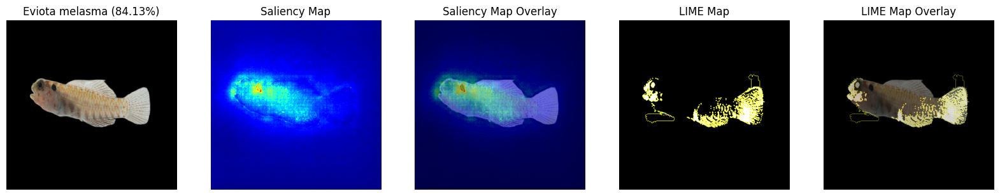

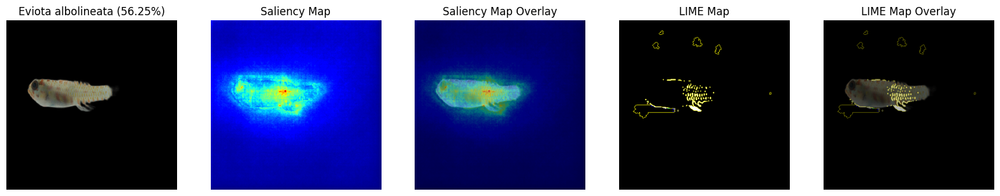

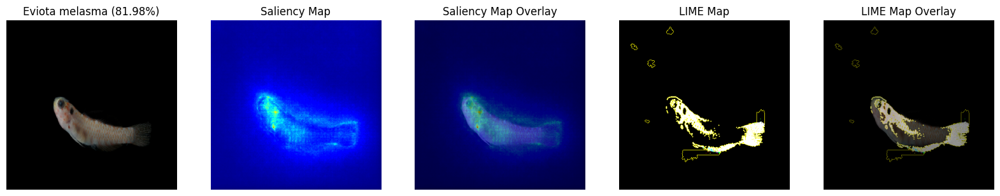

In [11]:
images_list = [
    '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_images_dataset/Gobiidae_Eviota_melasma/sjb_Eviota_melasma_34.jpeg',
    '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_images_dataset/Gobiidae_Eviota_melasma/sjb_Eviota_melasma_47.jpeg',
    '/Users/leonardo/Documents/Projects/cryptovision/data/processed/cv_images_dataset/Gobiidae_Eviota_melasma/sjb_Eviota_melasma_19.jpeg',
]



for image_path in images_list:
    preds = ai.predict(image_path)
    slcy_map = ai.generate_saliency_map('species', smooth_noise=0.2, smooth_samples=100)
    lime_map = ai.generate_lime_explanation(top_labels=1)
    
    temp, mask = lime_map.get_image_and_mask(
        lime_map.top_labels[0],
        num_features=10,
        negative_only=True,
        positive_only=False,
        hide_rest=True
    )
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 5, 1)
    plt.imshow(ai.image)
    plt.title(f'{preds[2]} ({ai.confidence[2]*100:.2f}%)')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(slcy_map[0], cmap='jet')
    plt.title('Saliency Map')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(ai.image)
    plt.imshow(slcy_map[0], cmap='jet', alpha=0.5)
    plt.title('Saliency Map Overlay')
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(mark_boundaries(temp, mask), cmap='jet')
    plt.title('LIME Map')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(ai.image)
    plt.imshow(mark_boundaries(temp, mask), cmap='jet', alpha=0.5)
    plt.title('LIME Map Overlay')
    plt.axis('off')

  0%|          | 0/1000 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 383.5, 383.5, -0.5)

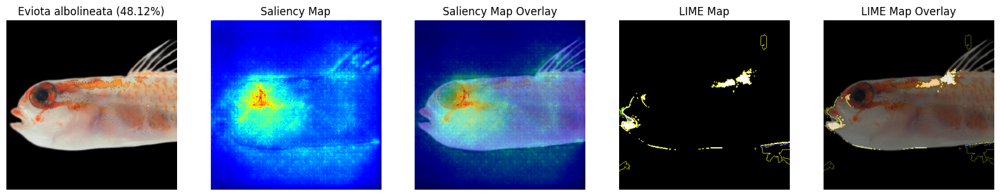

In [27]:
image_path = '/Users/leonardo/Desktop/Screenshot 2024-12-20 at 5.18.22 PM.png'

preds = ai.predict(image_path)
slcy_map = ai.generate_saliency_map('species', smooth_noise=0.2, smooth_samples=100)
lime_map = ai.generate_lime_explanation(top_labels=1)

temp, mask = lime_map.get_image_and_mask(
    lime_map.top_labels[0],
    num_features=10,
    negative_only=True,
    positive_only=False,
    hide_rest=True
)

plt.figure(figsize=(20, 10))
plt.subplot(1, 5, 1)
plt.imshow(ai.image)
plt.title(f'{preds[2]} ({ai.confidence[2]*100:.2f}%)')
plt.axis('off')

plt.subplot(1, 5, 2)
plt.imshow(slcy_map[0], cmap='jet')
plt.title('Saliency Map')
plt.axis('off')

plt.subplot(1, 5, 3)
plt.imshow(ai.image)
plt.imshow(slcy_map[0], cmap='jet', alpha=0.5)
plt.title('Saliency Map Overlay')
plt.axis('off')

plt.subplot(1, 5, 4)
plt.imshow(mark_boundaries(temp, mask), cmap='jet')
plt.title('LIME Map')
plt.axis('off')

plt.subplot(1, 5, 5)
plt.imshow(ai.image)
plt.imshow(mark_boundaries(temp, mask), cmap='jet', alpha=0.5)
plt.title('LIME Map Overlay')
plt.axis('off')


In [61]:
def input_perturbation_sensitivity(img_path, model, target_size=(384, 384), epsilon=0.01):
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    
    # Convert to TensorFlow tensor
    img_array = tf.convert_to_tensor(img_array)

    # Get original prediction
    with tf.GradientTape() as tape:
        tape.watch(img_array)
        preds = model(img_array)  # preds is a tuple (family, genus, species)
        
        # Extract top predicted class indices for each output
        top_family_class = tf.argmax(preds[0], axis=-1).numpy().item()
        top_genus_class = tf.argmax(preds[1], axis=-1).numpy().item()
        top_species_class = tf.argmax(preds[2], axis=-1).numpy().item()
        
        # Extract losses for each class
        loss = preds[0][0, top_family_class] + preds[1][0, top_genus_class] + preds[2][0, top_species_class]

    # Compute the gradient of the combined loss w.r.t. the input image
    gradient = tape.gradient(loss, img_array)
    
    # Calculate sensitivity map by perturbing the input image
    perturbation = epsilon * tf.sign(gradient)
    perturbed_img = img_array + perturbation
    perturbed_img = tf.clip_by_value(perturbed_img, -1.0, 1.0)

    # Get predictions for the perturbed image
    perturbed_preds = model(perturbed_img)

    # Calculate sensitivity for each prediction head separately
    sensitivity_family = tf.reduce_sum(tf.abs(preds[0] - perturbed_preds[0]))
    sensitivity_genus = tf.reduce_sum(tf.abs(preds[1] - perturbed_preds[1]))
    sensitivity_species = tf.reduce_sum(tf.abs(preds[2] - perturbed_preds[2]))

    # Sum the sensitivities (scalars)
    total_sensitivity = sensitivity_family + sensitivity_genus + sensitivity_species

    # Visualize
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original Image")
    
    plt.subplot(1, 2, 2)
    plt.imshow(np.uint8((perturbed_img[0].numpy() + 1.0) * 127.5))
    plt.title(f"Perturbed Image (Sensitivity: {total_sensitivity:.4f})")
    plt.show()


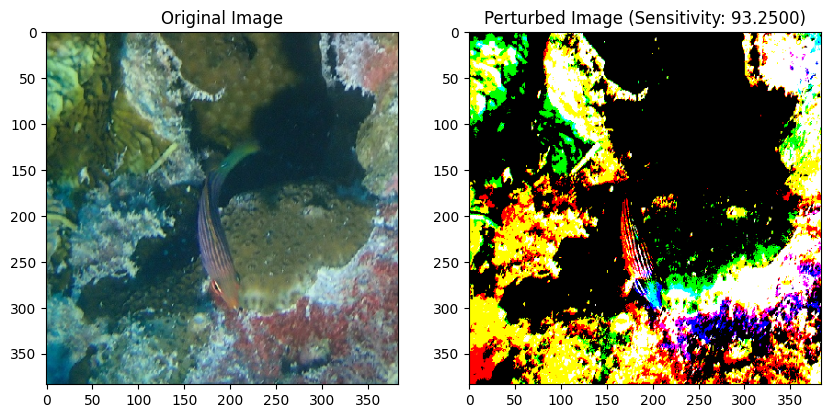

In [67]:
input_perturbation_sensitivity(test_df['image_path'].values[288], ai.model, target_size=(384, 384))